In [1]:
import sys
sys.path.append("../../eventepi")

import logging
import time
import warnings
from collections import Counter
warnings.filterwarnings('ignore')

import innvestigate
import keras
import matplotlib.pyplot as plt
import numpy as np
import tensorflow as tf

from gensim.models import KeyedVectors
from imblearn.metrics import (classification_report_imbalanced,
                              geometric_mean_score,
                              make_index_balanced_accuracy)
from innvestigate.utils.tests.networks import base as network_base
from keras.models import Model, load_model
from matplotlib import cm, transforms
from sklearn.metrics import (auc, confusion_matrix, matthews_corrcoef,
                             roc_auc_score, roc_curve)
from sklearn.utils import class_weight

from eventepi.classification import DataLoader, EmbeddingNormalizer, MeanDocumentEmbedder
from eventepi.idb import IDB

tf.get_logger().setLevel(logging.ERROR)

Using TensorFlow backend.


In [2]:
np.random.seed(13353)
tf.set_random_seed(13353)

In [4]:
wv = KeyedVectors.load("../data/embeddings/embeddings_300")
vocab = [i for i in wv.wv.vocab.keys()]

# Unknown vocabs are set to <UNK>.
encoder = dict(zip(['<UNK>'] + vocab, range(len(vocab) +1)))
decoder = dict(zip(encoder.values(), encoder.keys()))

pretrained_embedding = np.array([wv.wv[word] for word in vocab])

# Unknown vocabs will have embedding weights of zero.
embedding = np.zeros((pretrained_embedding.shape[0]+1, pretrained_embedding.shape[1]))
embedding[1:, :] = pretrained_embedding

In [5]:
X, y = DataLoader().labeled_texts()

normalizer = EmbeddingNormalizer()
X_normalized = [normalizer.normalize(text) for text in X]

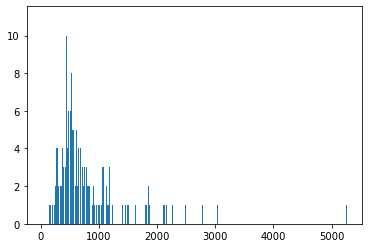

In [6]:
doc_lengths = [len(x) for x in X_normalized]
counter_doc_lenghts = Counter(doc_lengths)

counter_doc_lenghts.most_common(5)

plt.bar(counter_doc_lenghts.keys(), counter_doc_lenghts.values())
plt.show()

In [7]:
len(list(filter(lambda x: x<400, doc_lengths)))

597

In [8]:
MAX_SEQ_LENGTH = 400 # Calculated from where 63 is the shortest found text
EMBEDDING_DIM = embedding.shape[1]

data_indices = np.array(range(len(X)))

train, validate, test = np.split(data_indices, [int(.6*len(X)), int(.8*len(X))], )

print("Training set size: ", len(train))
print("Validation set size: ", len(validate))
print("Test set size: ", len(test))

Training set size:  1941
Validation set size:  647
Test set size:  648


In [9]:
def prepare_own_dataset(X_sub_set, y_sub_set):
    xd = np.zeros((len(X_sub_set), MAX_SEQ_LENGTH, EMBEDDING_DIM))
    y = y_sub_set

    articles = []
    for i, tokenized in enumerate(X_sub_set):
        article = []
        for j, v in enumerate(tokenized[:MAX_SEQ_LENGTH]):
            if v in encoder and ("promed" not in v) and ("who" not in v):
                e_idx = encoder[v]
            else:
                e_idx = 0

            xd[i, j, :] = embedding[e_idx]
            article.append(e_idx)
        articles.append(article)

    return dict(x4d=np.expand_dims(xd, axis=1), y=y, encoded_articles=articles)


DATASETS = dict()

DATASETS["training"] = prepare_own_dataset(
    np.array(X_normalized)[train], np.array(y)[train]
)
DATASETS["testing"] = prepare_own_dataset(
    np.array(X_normalized)[test], np.array(y)[test]
)
DATASETS["validation"] = prepare_own_dataset(
    np.array(X_normalized)[validate], np.array(y)[validate]
)

In [10]:
NUM_CLASSES = 2

def build_network(
    input_shape=(None, 1, MAX_SEQ_LENGTH, EMBEDDING_DIM), output_n=NUM_CLASSES, activation=None, dense_unit=256, dropout_rate=0.5
):
    net = {}
    net["in"] = network_base.input_layer(shape=input_shape)

    net["conv"] = keras.layers.Conv2D(
        filters=150,
        kernel_size=(1, 2),
        strides=(1, 1),
        activation="relu",
        padding="valid",
#         data_format="channels_first"
    )(net["in"])
    net["dropout"] = keras.layers.Dropout(dropout_rate)(net["conv"])
    net["pool"] = keras.layers.MaxPooling2D(
        pool_size=(1, input_shape[2] - 1), strides=(1, 1)
    )(net["dropout"])

    net["out"] = network_base.dense_layer(
        keras.layers.Flatten()(net["pool"]), units=output_n, activation="tanh"
    )
    net["sm_out"] = network_base.softmax(net["out"])
    net.update(
        {"input_shape": input_shape, "output_n": output_n,}
    )
    return net


net = build_network((None, 1, MAX_SEQ_LENGTH, EMBEDDING_DIM), NUM_CLASSES)
model_without_softmax, model_with_softmax = (
    Model(inputs=net["in"], outputs=net["out"]),
    Model(inputs=net["in"], outputs=net["sm_out"]),
)

def recall(y_true, y_pred):
    true_positives = keras.backend.sum(
        keras.backend.round(keras.backend.clip(y_true * y_pred, 0, 1))
    )
    possible_positives = keras.backend.sum(
        keras.backend.round(keras.backend.clip(y_true, 0, 1))
    )
    recall = true_positives / (possible_positives + keras.backend.epsilon())
    return recall


def to_one_hot(y):
    return keras.utils.to_categorical(y, NUM_CLASSES)


def train_model(model, batch_size=200, epochs=10):

    x_train = DATASETS["training"]["x4d"]
    y_train = to_one_hot(DATASETS["training"]["y"])

    x_test = DATASETS["testing"]["x4d"]
    y_test = to_one_hot(DATASETS["testing"]["y"])

    x_val = DATASETS["validation"]["x4d"]
    y_val = to_one_hot(DATASETS["validation"]["y"])

    model.compile(
        loss="categorical_crossentropy", optimizer=keras.optimizers.Adam(), metrics=[recall, "accuracy"]
    )
    class_weights = class_weight.compute_class_weight(
        "balanced", np.unique(DATASETS["training"]["y"]), DATASETS["training"]["y"]
    )
    class_weights = dict(zip([0, 1], class_weights))
    history = model.fit(
        x_train,
        y_train,
        batch_size=batch_size,
        epochs=epochs,
        verbose=1,
        validation_data=(x_val, y_val),
        class_weight=class_weights,
    )
    score = model.evaluate(x_test, y_test, verbose=0)
    print("Test loss:", score[0])
    print("Test precision:", score[1])

In [156]:
train_model(model_with_softmax, batch_size=128, epochs=10)

Train on 1941 samples, validate on 647 samples
Epoch 1/10
1941/1941 [==============================] - 6s 3ms/step - loss: 0.6833 - recall: 0.9351 - acc: 0.9351 - val_loss: 0.3985 - val_recall: 0.9150 - val_acc: 0.9150
Epoch 2/10
1941/1941 [==============================] - 5s 2ms/step - loss: 0.5849 - recall: 0.9547 - acc: 0.9547 - val_loss: 0.4609 - val_recall: 0.8794 - val_acc: 0.8794
Epoch 3/10
1941/1941 [==============================] - 5s 2ms/step - loss: 0.5084 - recall: 0.7589 - acc: 0.7589 - val_loss: 0.7033 - val_recall: 0.6121 - val_acc: 0.6121
Epoch 4/10
1941/1941 [==============================] - 4s 2ms/step - loss: 0.4069 - recall: 0.8284 - acc: 0.8284 - val_loss: 0.6053 - val_recall: 0.6692 - val_acc: 0.6692
Epoch 5/10
1941/1941 [==============================] - 5s 2ms/step - loss: 0.3363 - recall: 0.8511 - acc: 0.8511 - val_loss: 0.4594 - val_recall: 0.7960 - val_acc: 0.7960
Epoch 6/10
1941/1941 [==============================] - 5s 2ms/step - loss: 0.2999 - recall: 

In [ ]:
# model_without_softmax.set_weights(model_with_softmax.get_weights())

# model_with_softmax.save("data/results/CNN_model_softmax")
# model_without_softmax.save("data/results/CNN_model_without_softmax")

In [12]:
model_with_softmax = load_model('../data/results/CNN_model_softmax', custom_objects={"recall": recall})
model_without_softmax = load_model('../data/results/CNN_model_without_softmax', custom_objects={"recall": recall})

                   pre       rec       spe        f1       geo       iba       sup

      False       0.96      0.78      0.55      0.86      0.65      0.43       606
       True       0.14      0.55      0.78      0.23      0.65      0.42        42

avg / total       0.91      0.76      0.56      0.82      0.65      0.43       648

[[470 136]
 [ 19  23]]
AUC score: 0.757858


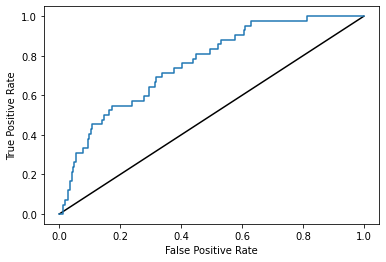

In [13]:
x_test = DATASETS['testing']['x4d']
y_test = DATASETS['testing']['y']

soft_max_predicted = model_with_softmax.predict(x_test)
y_pred = [soft_max_predicted[i][1] for i in range(len(x_test))]

fpr, tpr, _ = roc_curve(y_test, y_pred)

plt.xlabel('False Positive Rate')
plt.ylabel('True Positive Rate')
plt.plot([0, 1], [0, 1], linestyle='-', color="black")
plt.plot(fpr, tpr)

y_argmax = [soft_max_predicted[i].argmax() for i in range(len(x_test))]

print(classification_report_imbalanced(y_test, y_argmax))
print(confusion_matrix(y_test, y_argmax))
print('AUC score: {:3f}'.format(auc(fpr, tpr)))

In [241]:
with open("data/results/relevance_cnn_report.txt", "w") as f:
    f.write(classification_report_imbalanced(y_test, y_argmax) + "\n\n" + "training_time: 0.9 min")

In [24]:
from pathlib import Path
import pandas as pd

from keras.wrappers.scikit_learn import KerasClassifier
from sklearn.model_selection import learning_curve
from sklearn.metrics import make_scorer
from imblearn.metrics import make_index_balanced_accuracy, geometric_mean_score
from sklearn.base import BaseEstimator

In [15]:
def build_network(
    input_shape=(None, 1, MAX_SEQ_LENGTH, EMBEDDING_DIM), output_n=NUM_CLASSES, activation=None, dense_unit=256, dropout_rate=0.5
):
    net = {}
    net["in"] = network_base.input_layer(shape=input_shape)

    net["conv"] = keras.layers.Conv2D(
        filters=150,
        kernel_size=(1, 2),
        strides=(1, 1),
        activation="relu",
        padding="valid",
#         data_format="channels_first"
    )(net["in"])
    net["dropout"] = keras.layers.Dropout(dropout_rate)(net["conv"])
    net["pool"] = keras.layers.MaxPooling2D(
        pool_size=(1, input_shape[2] - 1), strides=(1, 1)
    )(net["dropout"])

    net["out"] = network_base.dense_layer(
        keras.layers.Flatten()(net["pool"]), units=output_n, activation="tanh"
    )
    net["sm_out"] = network_base.softmax(net["out"])
    net.update(
        {"input_shape": input_shape, "output_n": output_n,}
    )
    model = Model(inputs=net["in"], outputs=net["out"])
    model.compile(
        loss="categorical_crossentropy", optimizer=keras.optimizers.Adam(), metrics=[recall, "accuracy"]
    )
    return model

In [26]:
def plot_learning_curve(
        estimator, title, X, y, train_sizes=np.linspace(0.1, 1.0, 5)
    ):
        """
        Generate test and training learning curve.
        """
        _, ax = plt.subplots(1, 1, figsize=(8, 6))

        ax.set_title(title)
        ax.set_xlabel("Training examples")
        ax.set_ylabel("Score")
        train_sizes, train_scores, test_scores = learning_curve(
            estimator,
            X,
            y,
            train_sizes=train_sizes,
            scoring=make_scorer(make_index_balanced_accuracy()(geometric_mean_score)),
            verbose=1,
        )
        pd.DataFrame(
            {
                "train_size": np.array(
                    [[size] * train_scores.shape[1] for size in train_sizes]
                ).reshape(-1),
                "train_score": train_scores.reshape(-1),
                "test_score": test_scores.reshape(-1),
            }
        ).to_csv(
            Path(f"../data/results/{title.replace(' ', '_')}_values.csv")
        )
        train_scores_mean = np.mean(train_scores, axis=1)
        train_scores_std = np.std(train_scores, axis=1)
        test_scores_mean = np.mean(test_scores, axis=1)
        test_scores_std = np.std(test_scores, axis=1)

        # Plot learning curve
        ax.grid()
        ax.fill_between(
            train_sizes,
            train_scores_mean - train_scores_std,
            train_scores_mean + train_scores_std,
            alpha=0.1,
            color="r",
        )
        ax.fill_between(
            train_sizes,
            test_scores_mean - test_scores_std,
            test_scores_mean + test_scores_std,
            alpha=0.1,
            color="g",
        )
        ax.plot(train_sizes, train_scores_mean, "o-", color="r", label="Training score")
        ax.plot(
            train_sizes,
            test_scores_mean,
            "o-",
            color="g",
            label="Cross-validation score",
        )
        ax.legend(loc="best")

        plt.tight_layout()
        plt.savefig(
            Path(f"../data/results/{title.replace(' ', '_')}.pdf")
        )

In [27]:
class CNN(BaseEstimator):
    model = KerasClassifier(build_network)
    
    def fit(self, X, y):
        class_weights = class_weight.compute_class_weight(
        "balanced", np.unique(y), y
        )
        class_weights = dict(zip([0, 1], class_weights))
        return self.model.fit(X, y, epochs=10, class_weight=class_weights, batch_size=128)
    def predict(self, y):
        return self.model.predict(y)

[learning_curve] Training set sizes: [ 258  841 1423 2005 2588]


[Parallel(n_jobs=1)]: Using backend SequentialBackend with 1 concurrent workers.


Epoch 1/10
258/258 [==============================] - 3s 11ms/step - loss: 1.2367 - recall: 0.6512 - acc: 0.5116
Epoch 2/10
258/258 [==============================] - 1s 2ms/step - loss: 0.6674 - recall: 1.0000 - acc: 0.9690
Epoch 3/10
258/258 [==============================] - 1s 2ms/step - loss: 0.6916 - recall: 1.0000 - acc: 0.9690
Epoch 4/10
258/258 [==============================] - 1s 2ms/step - loss: 0.6929 - recall: 1.0000 - acc: 0.9690
Epoch 5/10
258/258 [==============================] - 1s 2ms/step - loss: 0.6931 - recall: 1.0000 - acc: 0.9690
Epoch 6/10
258/258 [==============================] - 1s 2ms/step - loss: 0.6931 - recall: 1.0000 - acc: 0.9612
Epoch 7/10
258/258 [==============================] - 1s 2ms/step - loss: 0.6931 - recall: 1.0000 - acc: 0.9419
Epoch 8/10
258/258 [==============================] - 1s 2ms/step - loss: 0.6931 - recall: 1.0000 - acc: 0.9574
Epoch 9/10
258/258 [==============================] - 1s 2ms/step - loss: 0.6931 - recall: 1.0000 - acc

[Parallel(n_jobs=1)]: Done  25 out of  25 | elapsed: 14.5min finished


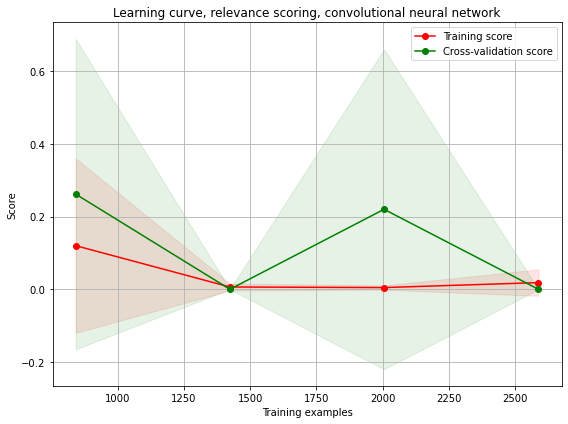

In [28]:
plot_learning_curve(
            CNN(),
    "Learning curve, relevance scoring, convolutional neural network",
            np.concatenate([DATASETS["training"]["x4d"], DATASETS["testing"]["x4d"], DATASETS["validation"]["x4d"]]),
            np.concatenate([DATASETS["training"]["y"], DATASETS["testing"]["y"],  DATASETS["validation"]["y"]]),
        )

In [159]:
# Specify methods that you would like to use to explain the model. 
# Please refer to iNNvestigate's documents for available methods.
methods = ['lrp.z', 'lrp.alpha_2_beta_1']
kwargs = [{}, {}, {}, {'pattern_type': 'relu'}]

# build an analyzer for each method
analyzers = []

for method, kws in zip(methods, kwargs):
    analyzer = innvestigate.create_analyzer(method, model_without_softmax, **kws)
    analyzer.fit(DATASETS['training']['x4d'], batch_size=128, verbose=1)
    analyzers.append(analyzer)

In [160]:
# specify indices of reviews that we want to investigate
test_sample_indices = np.where((y_test & y_argmax)>0)[0]
test_sample_preds = [None]*len(test_sample_indices)

# a variable to store analysis results.
analysis = np.zeros([len(test_sample_indices), len(analyzers), 1, MAX_SEQ_LENGTH])

for i, ridx in enumerate(test_sample_indices):

    x, y = DATASETS['testing']['x4d'][ridx], DATASETS['testing']['y'][ridx]

    x = x.reshape((1, 1, MAX_SEQ_LENGTH, EMBEDDING_DIM))    

    presm = model_without_softmax.predict_on_batch(x)[0] #forward pass without softmax
    prob = model_with_softmax.predict_on_batch(x)[0] #forward pass with softmax
    y_hat = prob.argmax()
    test_sample_preds[i] = y_hat
    
    for aidx, analyzer in enumerate(analyzers):

        a = np.squeeze(analyzer.analyze(x))
        a = np.sum(a, axis=1)

        analysis[i, aidx] = a

In [161]:
# This is a utility method visualizing the relevance scores of each word to the network's prediction.
# one might skip understanding the function, and see its output first.
def plot_text_heatmap(
    words, name, scores, title="", width=10, height=0.2, verbose=0, max_word_per_line=20
):
    fig = plt.figure(figsize=(width, height))

    ax = plt.gca()

    ax.set_title(title, loc="left")
    tokens = words
    if verbose > 0:
        print("len words : %d | len scores : %d" % (len(words), len(scores)))

    cmap = plt.cm.ScalarMappable(cmap=cm.bwr)
    cmap.set_clim(0, 1)

    canvas = ax.figure.canvas
    t = ax.transData

    normalized_scores = 0.5 * scores / np.max(np.abs(scores)) + 0.5

    if verbose > 1:
        print("Raw score")
        print(scores)
        print("Normalized score")
        print(normalized_scores)

    # make sure the heatmap doesn't overlap with the title
    loc_y = -0.2

    for i, token in enumerate(tokens):
        *rgb, _ = cmap.to_rgba(normalized_scores[i], bytes=True)
        color = "#%02x%02x%02x" % tuple(rgb)

        text = ax.text(
            0.0,
            loc_y,
            token,
            bbox={
                "facecolor": color,
                "pad": 5.0,
                "linewidth": 0.5,
                "boxstyle": "round,pad=0.5",
            },
            transform=t,
        )

        text.draw(canvas.get_renderer())
        ex = text.get_window_extent()

        # create a new line if the line exceeds the length
        if (i + 1) % max_word_per_line == 0:
            loc_y = loc_y - 2.5
            t = ax.transData
        else:
            t = transforms.offset_copy(text._transform, x=ex.width + 15, units="dots")

    if verbose == 0:
        ax.axis("off")
    if name:
        plt.savefig(name, bbox_inches="tight")

Review(id=10): crimean-congo hem fever afghanistan 05 update <UNK> post http <UNK> <UNK> program international society infectious diseases http //www.isid.org date tue 23 oct 2018 <UNK> source telegraph edited https <UNK> <UNK> cases deadly tick-borne fever increasingly sharply afghanistan severe drought forces farmers move infected livestock around country september 2018 saw 90 reported cases crimean-congo haemorrhagic fever cchf disease far killing nearly <UNK> infected toll jumped 244 cases last year 2017 455 cases far 2018 world health organisation said outbreak <UNK> effect drought forcing farmers land cchf carried blood livestock show symptoms passed humans via ticks contact infected blood fresh meat drought northern western afghanistan one country 's worst decades forced estimated 275 000 people leave homes farmers selling remaining cattle goats sheep taking cchf prevalent areas drought migration spreading disease said mohammad sahak said `` provinces west north high percentages

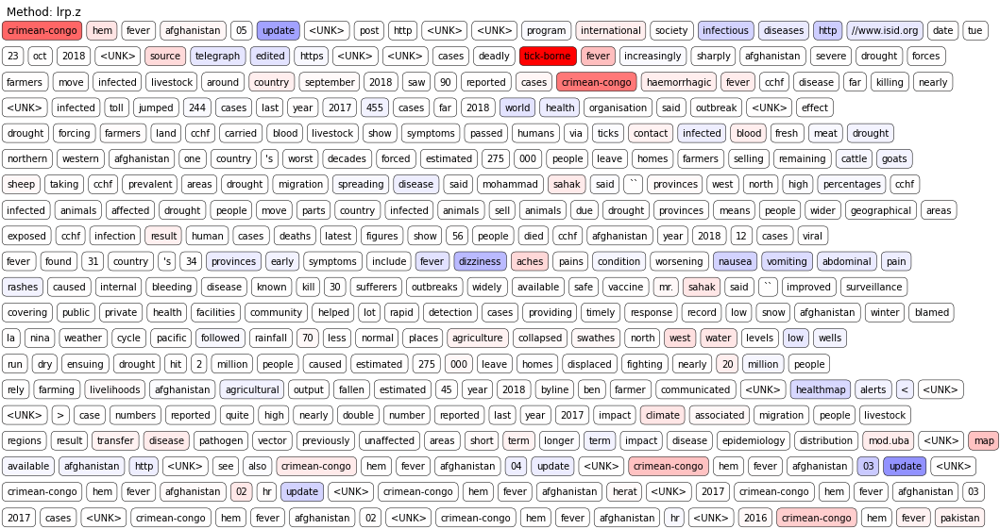

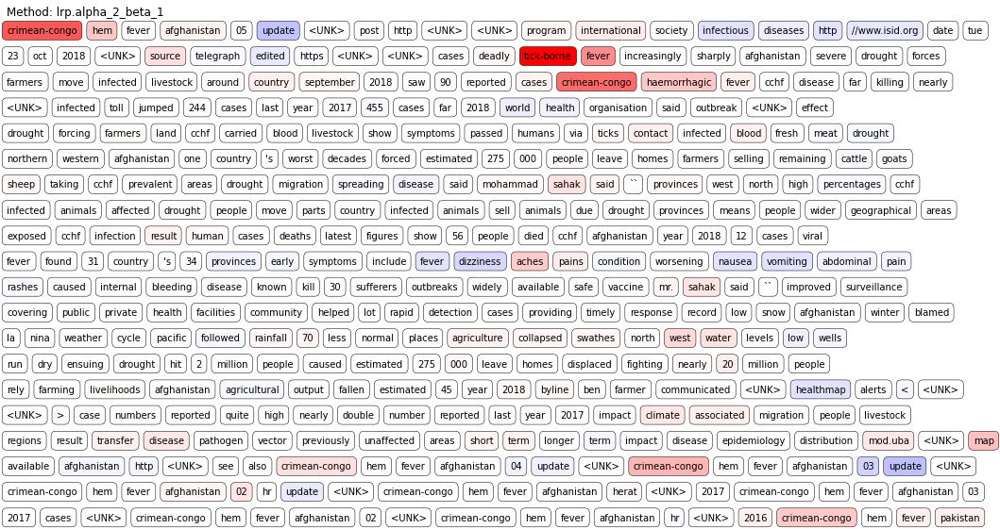

Review(id=37): monkeypox africa 16 nigeria <UNK> post http <UNK> <UNK> program international society infectious diseases http //www.isid.org date sat 13 oct 2018 source nigeria cdc situation report edited https <UNK> <UNK> <UNK> 20update 20of <UNK> 20outbreak 20in <UNK> key indicators numbers new cases reported 10 new confirmed 2 total confirmed cases 2018 38 total number confirmed cases reported september 2017 116 probable cases september 2017 4 total deaths 8 states least one confirmed case including fct 17 states reported least one suspected case including fct 26 confirmed health worker infection 2 highlight ncdc following closely ministry health israel following report confirmed monkeypox case israel 13 october travel history nigeria 10 new suspected cases monkeypox reported ebonyi 4 rivers 2 bayelsa 4 8 patient samples cluster 10 suspected cases epidemiological linkages 1st case uk tested found negative monkeypox positive chickenpox two cases require investigation 13 contacts 1st 

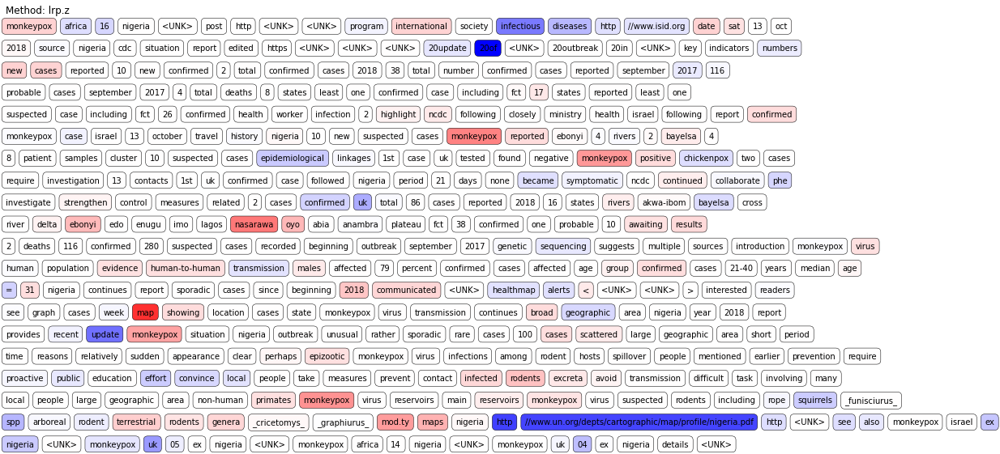

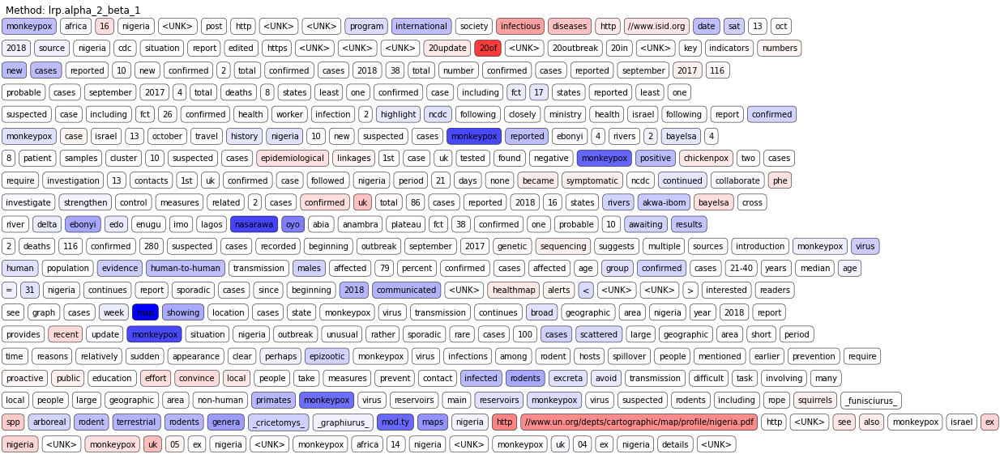

Review(id=59): lassa fever west africa 43 nigeria ondo <UNK> post http <UNK> <UNK> program international society infectious diseases http //www.isid.org date mon 29 oct 2018 source today nigeria edited https <UNK> <UNK> nigeria centre disease control ncdc confirmed 3 new cases lassa fever ondo state including health worker 2 new deaths also said monkeypox case israel 13 oct 2018 travel history nigeria according ncdc reporting week 42 week 15 oct 2018 one new healthcare worker infected ondo state 41 healthcare workers affected since onset outbreak 7 states ebonyi 16 edo 15 ondo 5 kogi 2 nasarawa one taraba one abia one 10 deaths ebonyi 5 kogi one abia one ondo 2 edo one ncdc confirmed 2 new cases monkeypox 10 new reported cases noted following closely ministry health israel following report confirmed monkeypox case country 13 oct 2018 travel history nigeria meanwhile lagos state governor mr akinwunmi ambode tomorrow 30 oct 2018 join governor-general canada julie payette inaugurate new b

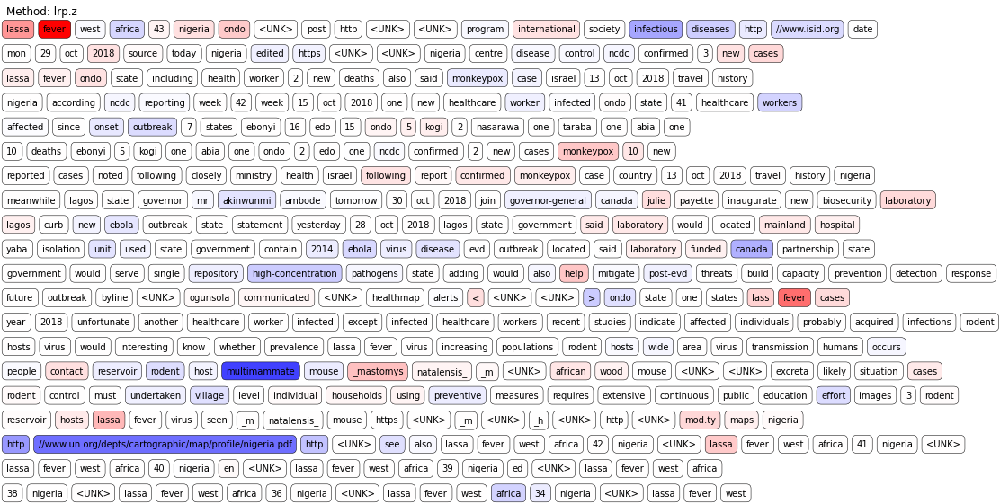

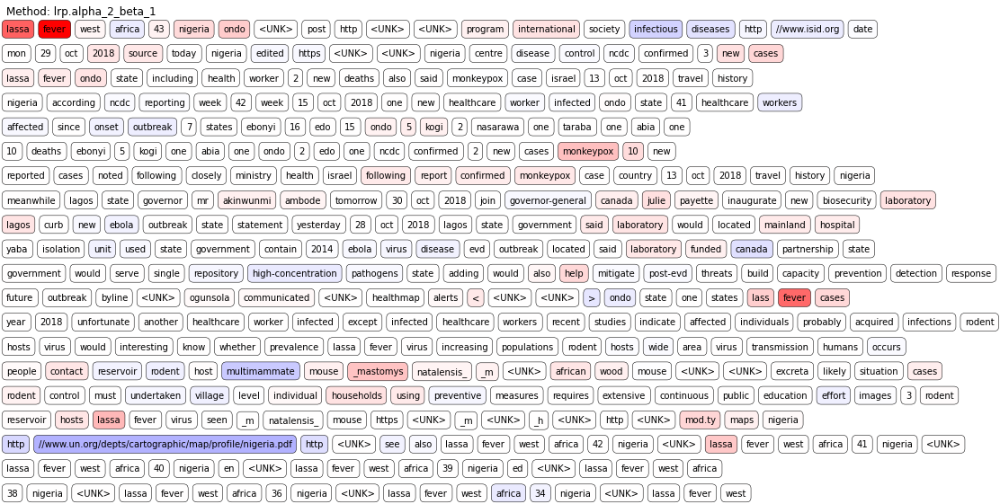

Review(id=197): japanese encephalitis india 22 madhya pradesh <UNK> post http <UNK> <UNK> program international society infectious diseases http //www.isid.org date sun 11 nov 2018 11:10 source hitavada edited http <UNK> <UNK> gradually hazardous diseases like japanese encephalitis je spreading wings state madhya pradesh currently 8 patients japanese encephalitis found positive madhya pradesh far sources health department condition anonymity informed us 8 je patients 3 bhopal days back 3 year old child died je health officials already started research virus around localities positive patients authorities concerned confirmed presence je virus areas sources informed total 8 je positive cases registered across state health department taking necessary measures get control hazardous je virus disease dr himanshu jaiswar director state vector borne disease control programme talking 'the hitavada said wake rising vectorborne diseases state vector borne disease control department conducting loc

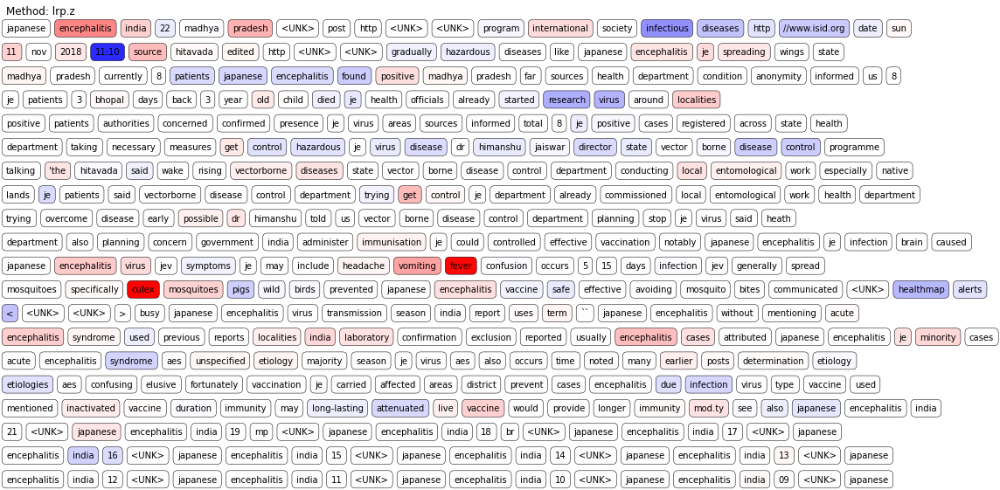

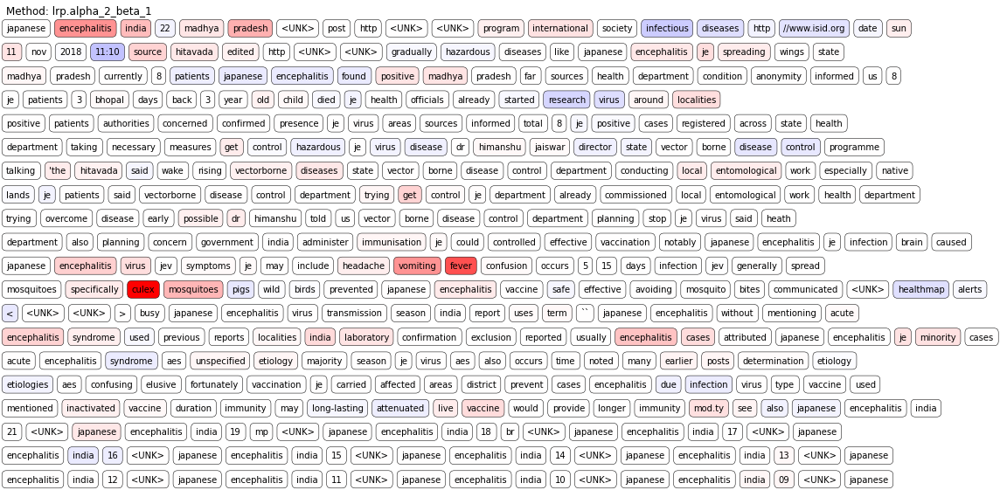

Review(id=201): lassa fever west africa 45 nigeria <UNK> post http <UNK> <UNK> program international society infectious diseases http //www.isid.org date sun 4 nov 2018 source nigeria center disease control ncdc edited https <UNK> <UNK> <UNK> 20update 20of <UNK> 20fever 20outbreak 20in <UNK> highlights reporting week 44 29 oct-4 nov 2018 5 new confirmed cases reported edo 3 ondo 1 ebonyi 1 state 2 new deaths edo 1 ebonyi 1 1 jan-4 nov 2018 total 2950 suspected cases reported 22 states 553 confirmed positive 17 probable 2380 negative case since onset 2018 outbreak 143 deaths confirmed cases 17 probable cases case fatality rate cfr confirmed cases 25.9 22 states recorded least one confirmed case across 90 local government areas edo ondo bauchi nasarawa ebonyi anambra benue kogi imo plateau lagos taraba delta osun rivers fct gombe ekiti kaduna abia adamawa enugu 18 states exited active phase outbreak 4 edo ondo ebonyi delta states remain active figure 1 see source url reporting week 44 29

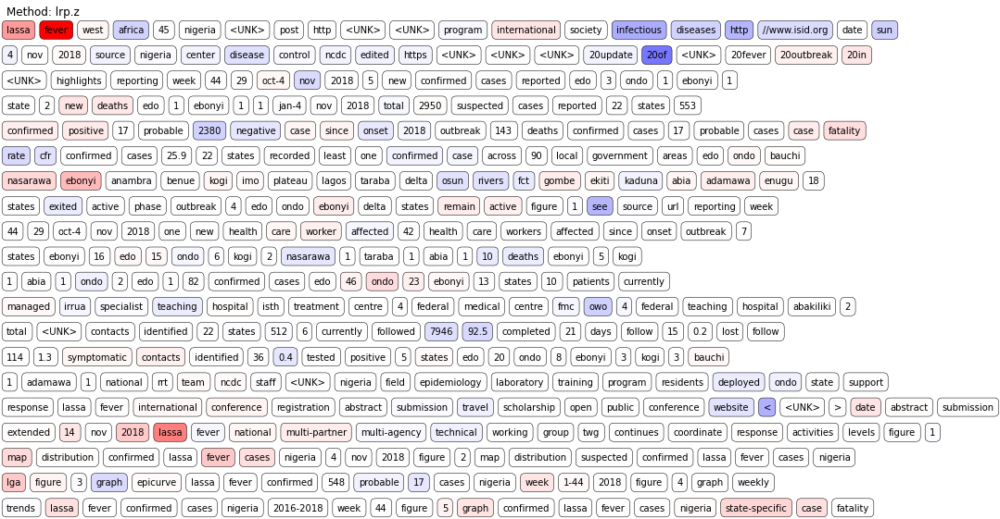

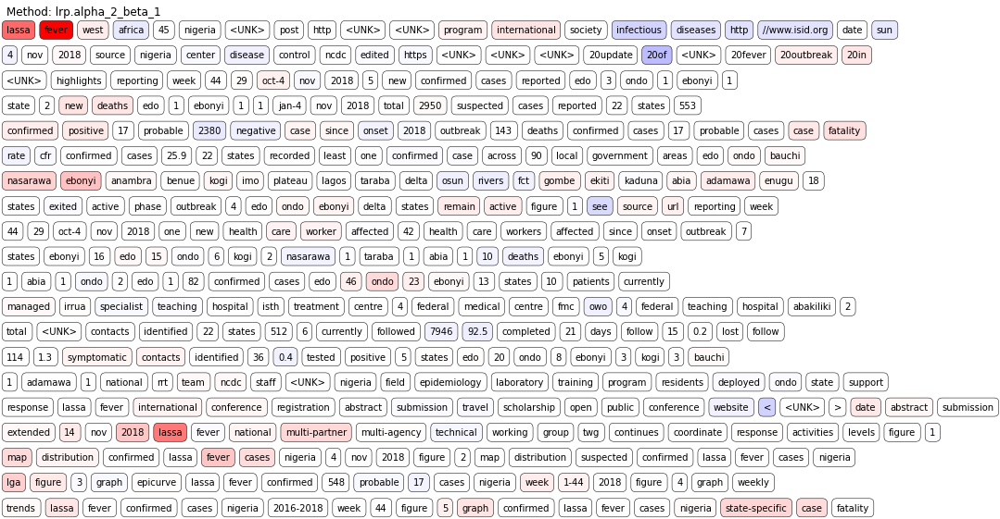

Review(id=233): anthrax namibia 04 kunene livestock human <UNK> post http <UNK> <UNK> program international society infectious diseases http //www.isid.org date 13 nov 2018 source namibia broadcasting corporation edited https <UNK> thirteen human anthrax cases recorded sesfontein kunene region 35 residents consumed meat livestock died unknown disease deaths reported disease since contained says health social services permanent secretary ben <UNK> joint statement signed ministry health social services agriculture total 92 small stock died outbreak sesfontein 23 buffalo died bwabwata national park ministries collaborating matter informed farmers general public danger affected areas post exposure prophylactic medicines also administered thus far 44 people areas <UNK> <UNK> <UNK> kunene symptoms signs humans include swollen painful lymph glands vomiting abdominal pain headaches loss appetite fever sore throat communicated <UNK> < <UNK> <UNK> > report provides information human cases involv

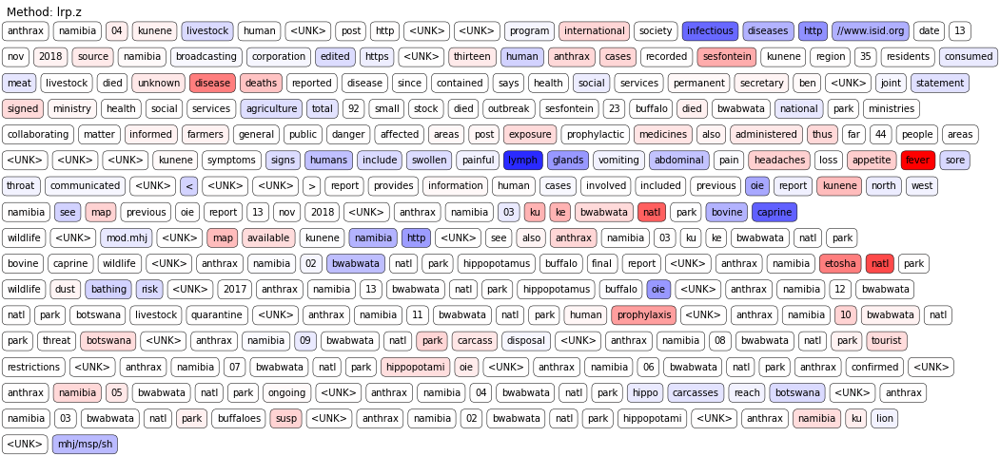

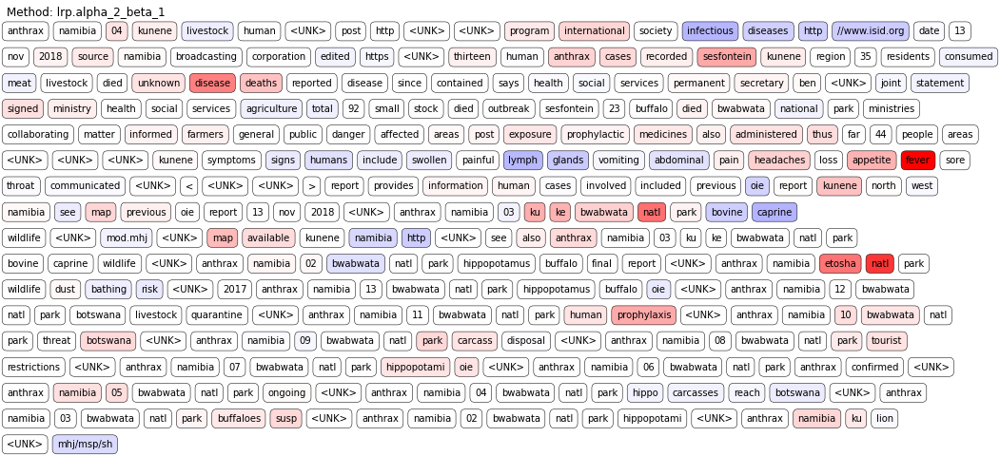

Review(id=278): lassa fever west africa 46 nigeria <UNK> post http <UNK> <UNK> program international society infectious diseases http //www.isid.org date sun 18 nov 2018 source nigeria center disease control ncdc edited https <UNK> <UNK> <UNK> 20update 20of <UNK> 20fever 20outbreak 20in <UNK> highlights reporting week 46 12-18 nov 2018 3 new confirmed cases reported edo 1 ondo 2 states one new death 1 jan-18 nov 2018 total 3086 suspected cases reported 22 states 562 confirmed positive 17 probable 2507 negative case since onset 2018 outbreak 144 deaths confirmed cases 17 probable cases case fatality rate cfr confirmed cases 25.6 percent 22 states recorded least one confirmed case across 90 local government areas edo ondo bauchi nasarawa ebonyi anambra benue kogi imo plateau lagos taraba delta osun rivers fct gombe ekiti kaduna abia adamawa enugu three states edo ondo ebonyi active phase outbreak figure 1 reporting week 46 new healthcare worker affected 43 healthcare workers affected 7 s

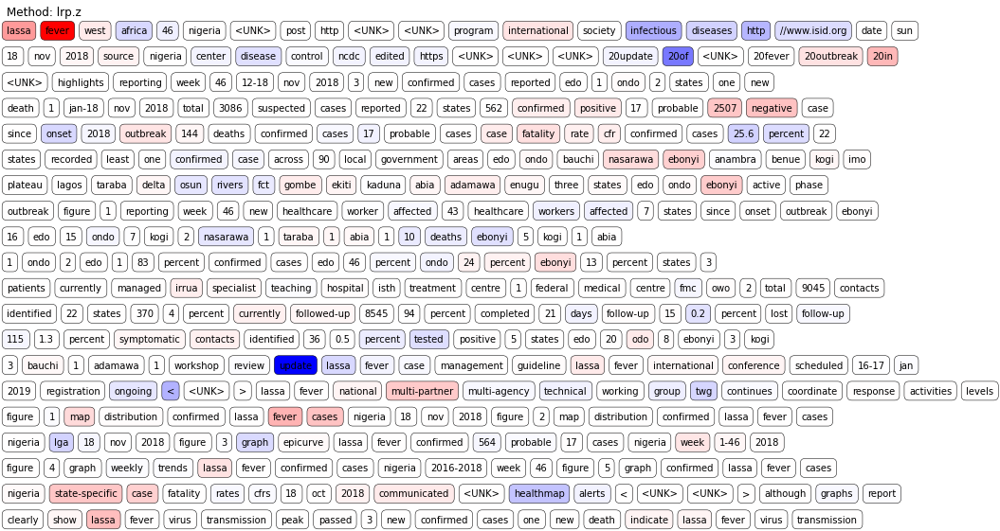

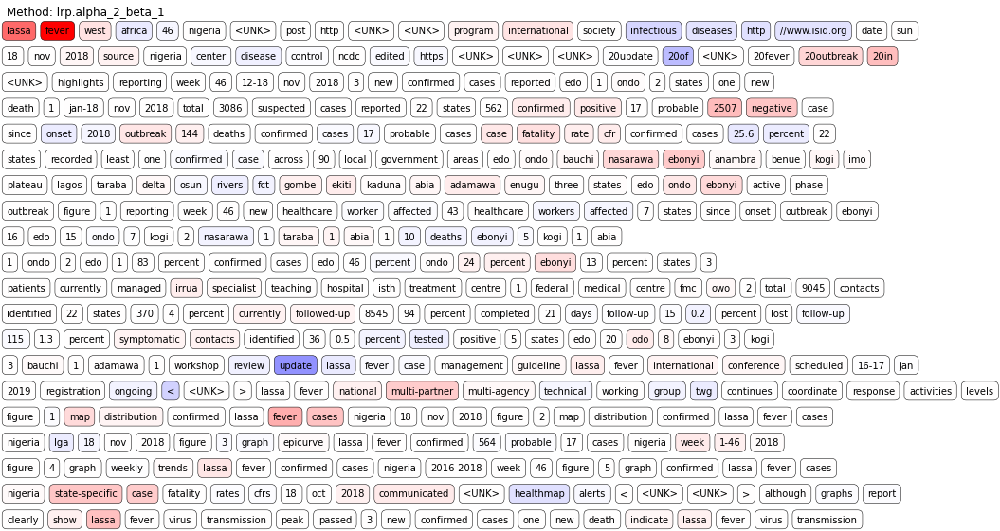

Review(id=350): malaria dominican republic 03 autochthonous imported <UNK> post http <UNK> <UNK> program international society infectious diseases http //www.isid.org date sat 1 dec 2018 sources http <UNK> <UNK> health officials dominican republic reporting increase malaria cases 2018 according diario salud report computer translated 438 cases reported year date compared 360 period 2017 92 percent malaria cases due _plasmodium falciparum_ remainder _p vivax_ mixed infections one death reported last month 31 cases malaria reported 27 indigenous 4 imported 3 venezuela one guyana communicated <UNK> healthmap alerts < <UNK> <UNK> > autochthonous malaria reported dominican republic past 15 years documented especially malaria returning visitors main problem proximity haiti malaria endemic asymptomatic carriers haiti start local transmission dominican republic one solution could screening upon arrival possible course treatment instance artemether/lumefantrine upon arrival ending single dose p

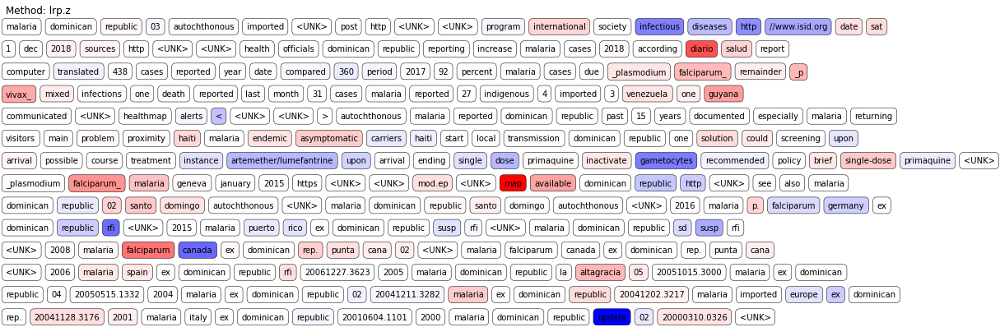

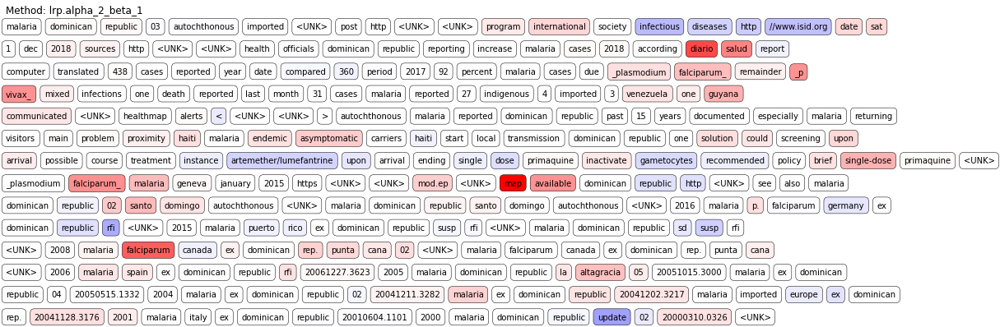

Review(id=478): japanese encephalitis india 23 maharashtra <UNK> post http <UNK> <UNK> program international society infectious diseases http //www.isid.org date sat 15 dec 2018 source <UNK> edited http <UNK> maharashtra recorded 108 cases japanese encephalitis mainly endemic districts past 11 months 30 recorded throughout 2017 culex mosquitoes feed animal blood especially pigs ardeid birds herons egrets bitterns main vector disease virus `` 108 japanese encephalitis je cases diagnosed maharashtra far year 2018 6 symptomatic needed immediate treatment remaining 102 cases detected fever surveillance undertaken affected areas patients symptomatic n't need treatment state entomologist mahendra jagtap told toi 6 patients reporting severe illness endemic region vidarbha including gadchiroli wardha endemic belt vidarbha health officials detected one je case aurangabad thane year 2018 102 patients <UNK> blood samples je virus antibodies picked door-to-door fever surveillance develop illness d

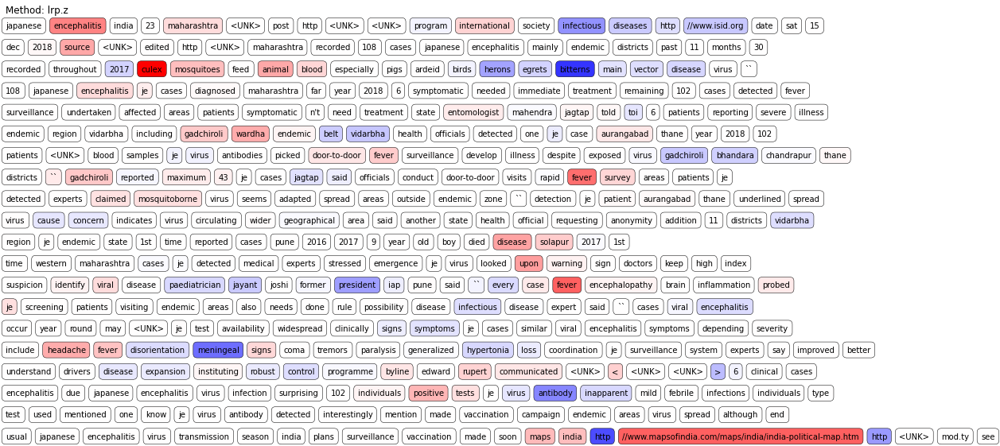

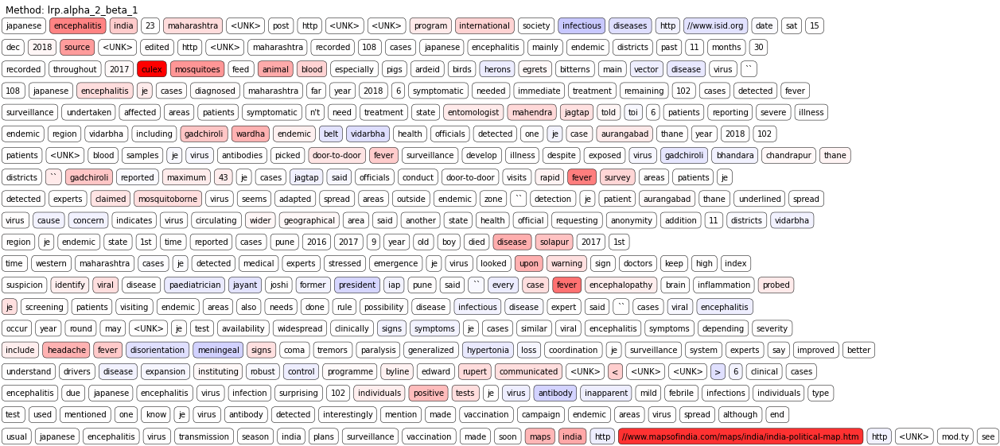

Review(id=540): malaria uzbekistan certified malaria-free <UNK> post http <UNK> <UNK> program international society infectious diseases http //www.isid.org date thu 27 dec 2018 source vanguard ngr news edited https <UNK> <UNK> world health organization certified uzbekistan malaria-free confirming end country 's half-century-long battle malaria elimination within borders uzbekistan become 2nd country 2018 certified malaria-free paraguay certified june marking another milestone road ending disease good `` malaria commends government uzbekistan resilience determination eliminate malaria uzbekistan 's decade-long commitment demonstrates government 's recognition malaria stood way development ridding country disease critical improving country 's economic outlook protecting health people said martin edlund ceo malaria uzbekistan 1st eliminated malaria 1961 struggled maintain elimination malaria cases continued flow neighboring countries 2000 recognising barriers malaria within borders countr

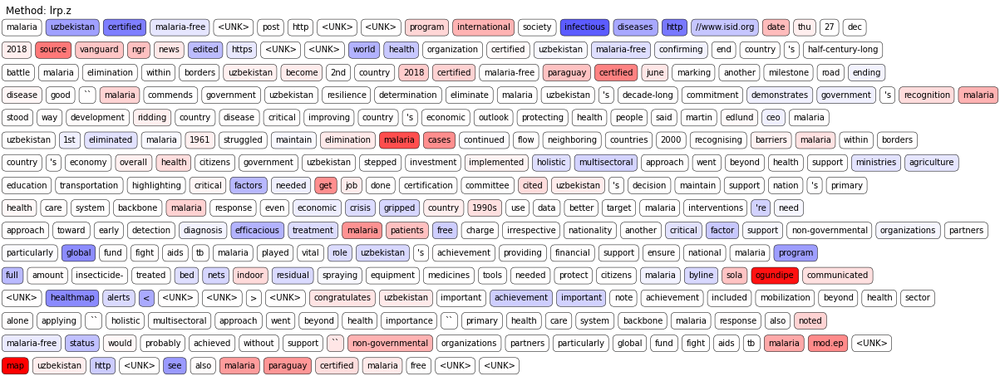

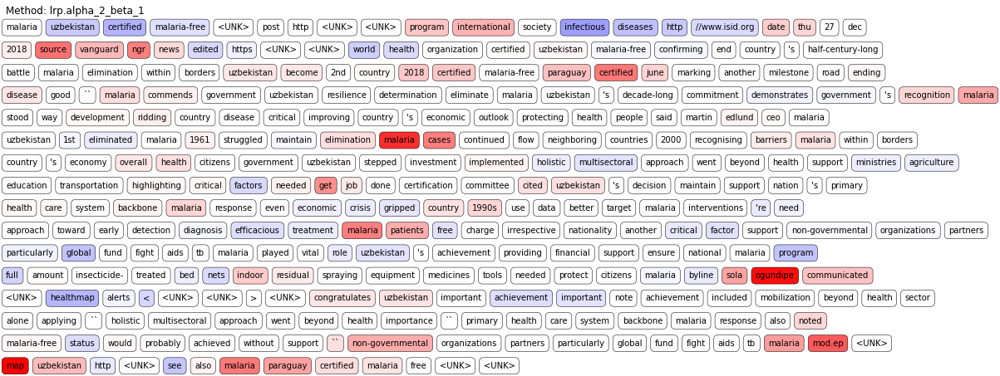

Review(id=561): circulating vaccine derived poliovirus papua new guinea 21 may 2018 regional polio reference laboratory reported isolation vaccine derived poliovirus type 1 vdpv1 child acute flaccid paralysis afp lae morobe province papua new guinea onset child paralysis occurred 24 april 2018 response single case vdpv1 enhanced surveillance active case finding implemented including collection stool samples household community contacts index case 20 june regional polio reference laboratory notified isolation vdpv1 stools two healthy community contacts index case results sent global polio reference laboratory united states centers disease control prevention us cdc confirmed 21 june two isolates genetically linked index case indicating circulation poliovirus within community public health response response detection poliovirus index case mop-up vaccination undertaken lae case lives eastern highlands province case stayed prior onset paralysis addition medical record review active case sea

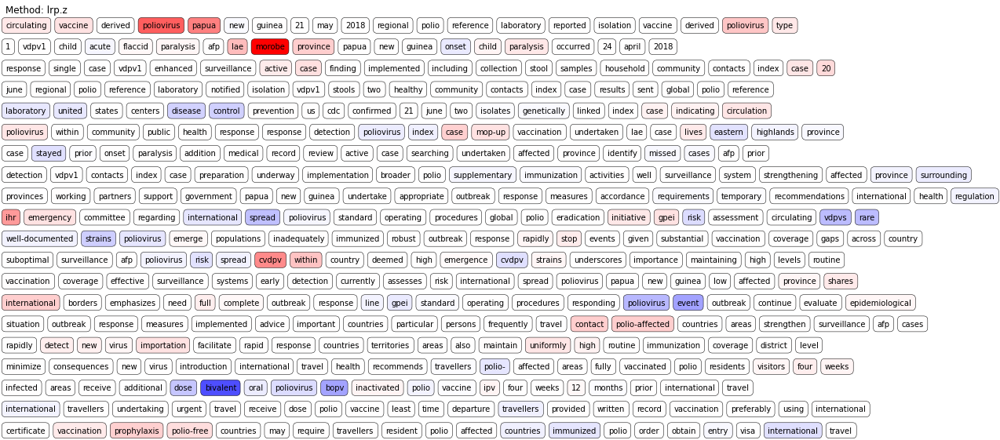

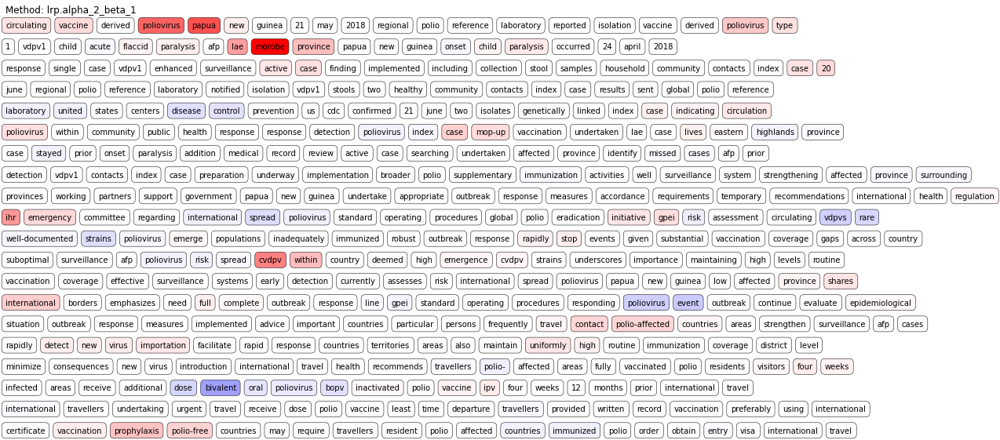

Review(id=567): monkeypox cameroon 30 april 30 may 2018 total 16 confirmed suspected cases one confirmed 15 suspected cases reported directorate control epidemic pandemic diseases <UNK> cases located five districts cameroon <UNK> health district n=6 suspected n=1 confirmed akwaya health district n=6 suspected <UNK> health district n=1 suspected bertoua health district n=1 suspected fotokol health district n=1 suspected 14 may one 16 cases tested positive reverse transcription polymerase chain reaction rt-pcr centre pasteur du cameroun cpc case located <UNK> health district confirmed case 20-year-old male clinical symptoms fever generalized <UNK> pustular rash enlarged lymph nodes previous history travel contact animal suspected monkeypox age 16 cases range one month 58 years old median age 13 years old nearly half 16 cases male nine men seven women additionally cases fever body rash deaths reported public health response activated coordination operational planning pillars part response

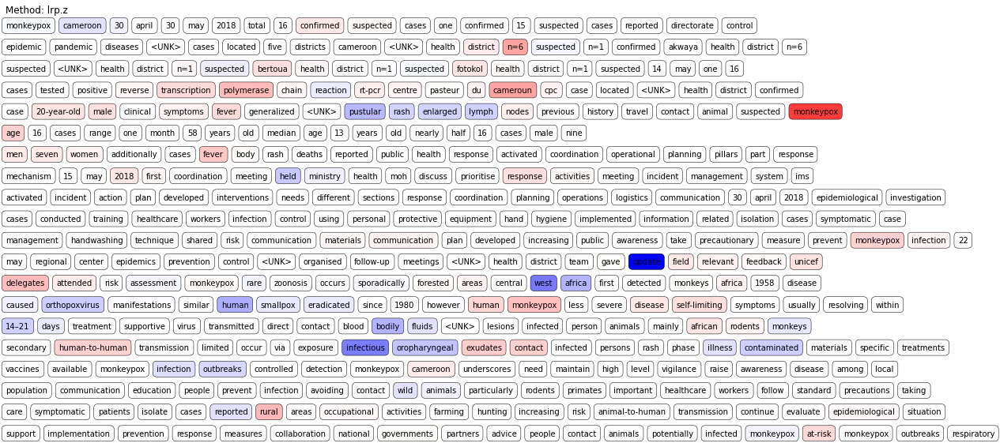

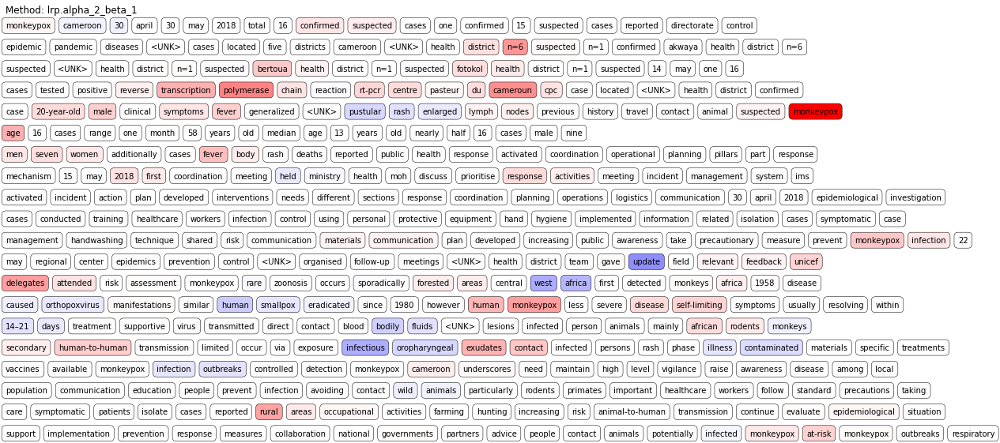

Review(id=570): monkeypox nigeria 26 september 2017 alerted suspected outbreak monkeypox yenagoa local government area lga bayelsa state nigeria index cluster reported family developed similar symptoms fever generalized skin rash period four weeks epidemiological investigations cluster show infected cases contact monkey month prior onset onset outbreak september 2017 15 september 2018 total 269 suspected cases across 25 states one territory including 115 confirmed cases across 16 states one territory reported seven deaths recorded four patients pre-existing immunocompromised condition two health care workers among confirmed cases affected age group 21–40 years 79 confirmed cases males 2018 total 76 cases reported 37 confirmed one probable two deaths cases reported 14 states one territory abia akwa-ibom anambra bayelsa cross river delta edo enugu imo lagos nasarawa oyo plateau rivers federal capital territory fct genetic sequencing suggests multiple introductions monkeypox virus <UNK> p

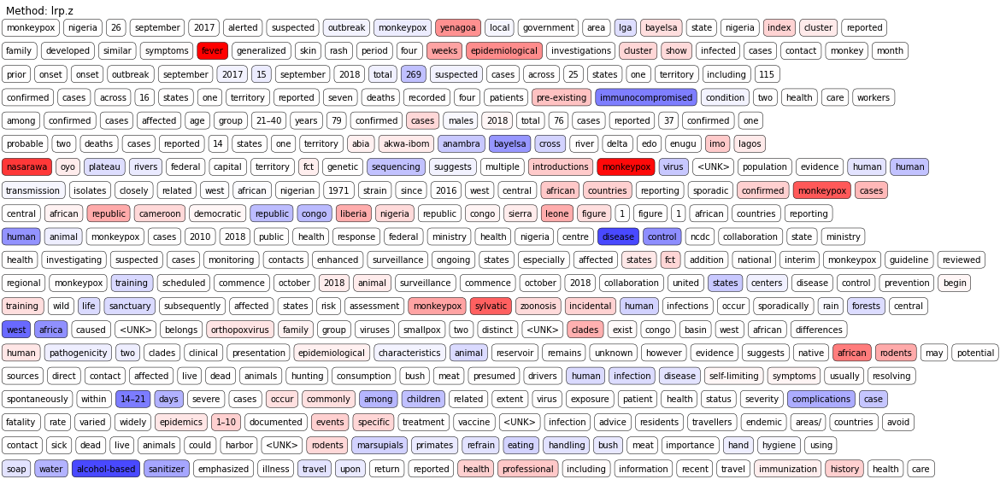

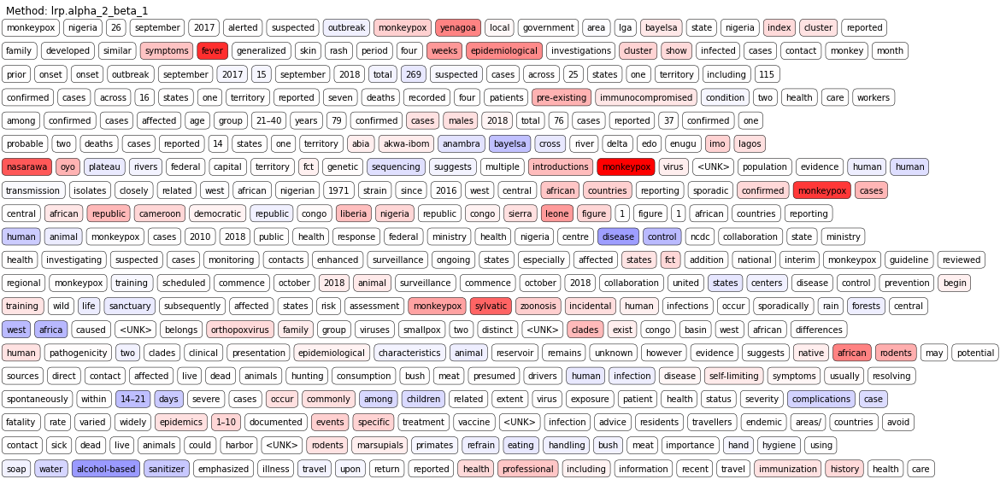

Review(id=575): nipah virus india 17 july 2018 total 19 nipah virus niv cases including 17 deaths reported kerala state 18 cases laboratory- confirmed deceased index case suspected niv could tested outbreak localized two districts kerala state kozhikode malappuram new cases deaths reported since 1 june 2018 30 july human-to-human transmission niv contained kerala state reported disease outbreak news published 31 may 2018 three deaths due niv infection reported 19 may kozhikode district kerala state three four reported deaths confirmed positive niv real-time polymerase chain reaction rt-pcr igm elisa niv two patients recovered completely discharged hospital acute respiratory distress syndrome encephalitis observed among patients infected first niv outbreak reported kerala state third niv outbreak known occurred india two previous outbreaks occurred state west bengal 2001 2007 public health response government response multi-disciplinary central team national centre disease control sent 

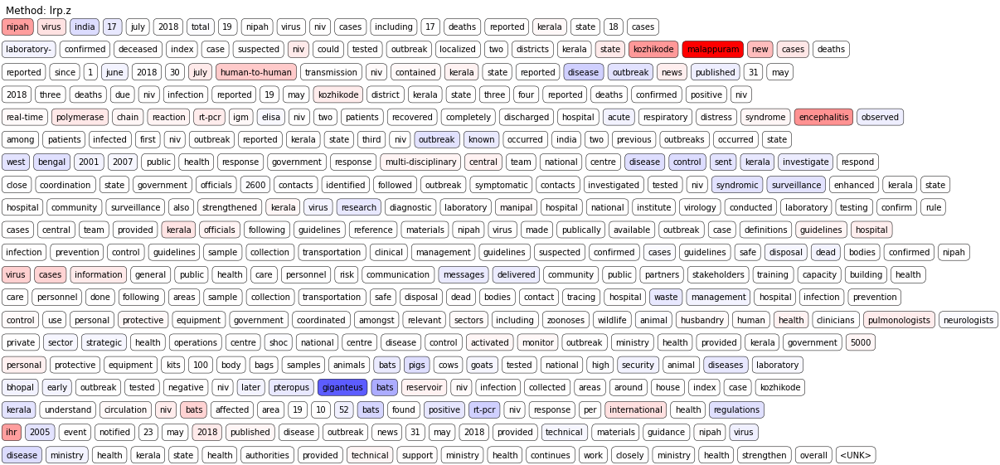

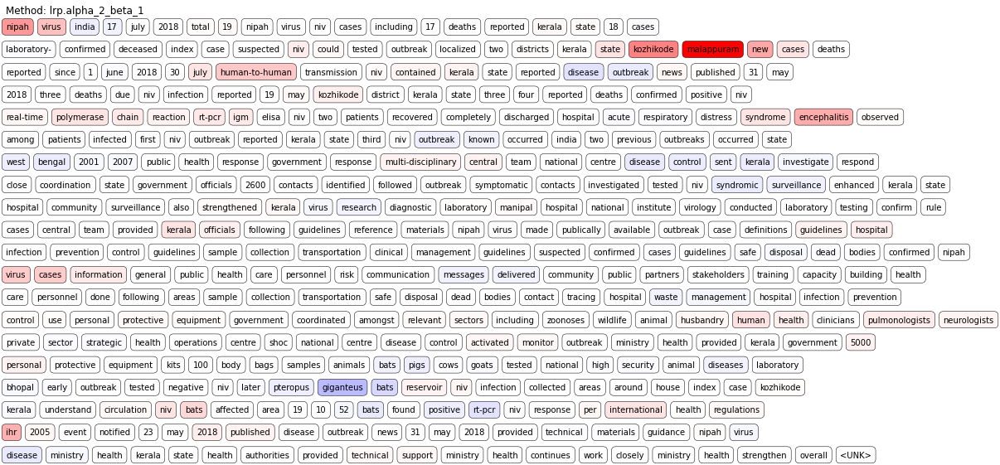

Review(id=583): ebola virus disease democratic republic congo 8 may 2018 notified ministry health democratic republic congo two confirmed cases ebola virus disease occurring bikoro health zone equateur province 4 april 9 may 2018 total 32 ebola virus disease cases among two confirmed 18 probable 12 suspected cases reported bikoro health zone equateur province including 18 deaths three 32 cases among healthcare workers patients presented fever diarrhoea abdominal pain myalgia arthralgia also showed haemorrhagic signs symptoms cases reported catchment area ikoko-impenge health facility located 30 km central health zone office bikoro 280 km road mbandaka capital equateur province 21 initially reported cases 8 may 2018 17 epidemiological links potential contacts another suspect case five samples collected hospitalized patients three <UNK> <UNK> two bikoro sent institute national de recherche biomédicale kinshasa 7 may 2018 two samples ikoko-impenge found positive reverse transcriptase poly

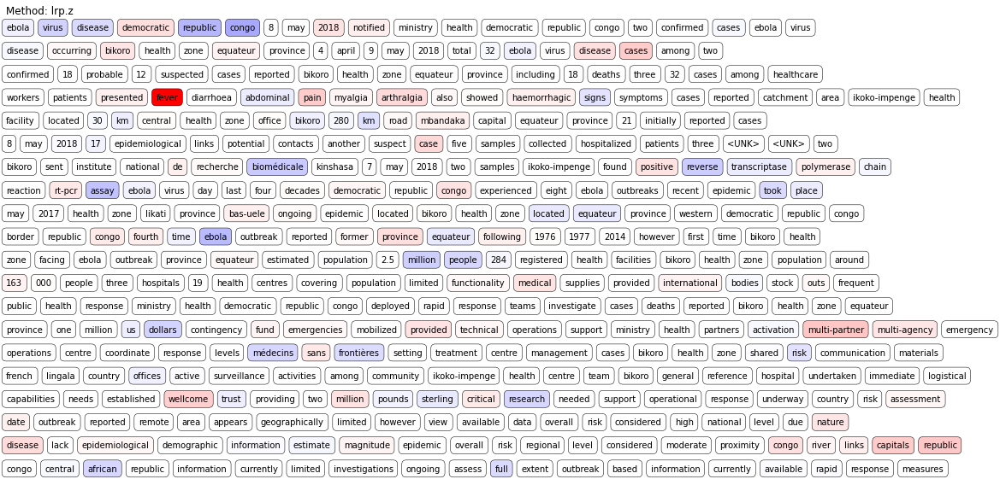

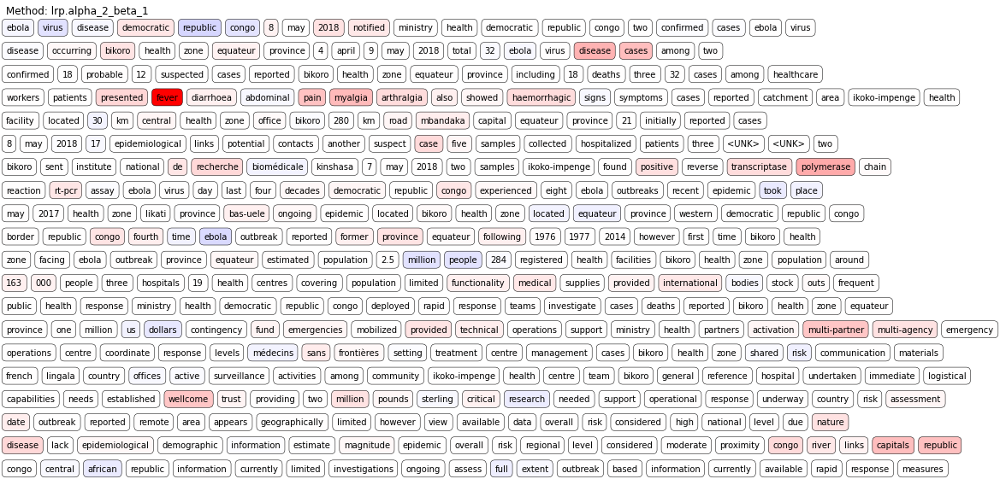

Review(id=597): middle east respiratory syndrome coronavirus mers-cov oman 4 march 2018 national ihr focal point oman reported one additional case middle east respiratory syndrome coronavirus mers-cov patient 74-year-old male omani national living batinah symptom onset 23 february 2018 patient neither recently travelled contact person respiratory symptoms known mers-cov case patient took care camels reportedly ill investigation patient exposure 14 days prior onset symptoms still ongoing prior patient last laboratory-confirmed case mers-cov oman reported november 2017 globally 2144 laboratory-confirmed cases mers-cov including least 750 related deaths reported details case detailed information concerning patient reported found separate document see link public health response identification tracing follow family health care workers contacts ongoing including mers-cov screening identified contacts monitored 14 days last possible date exposure risk assessment infection mers-cov cause seve

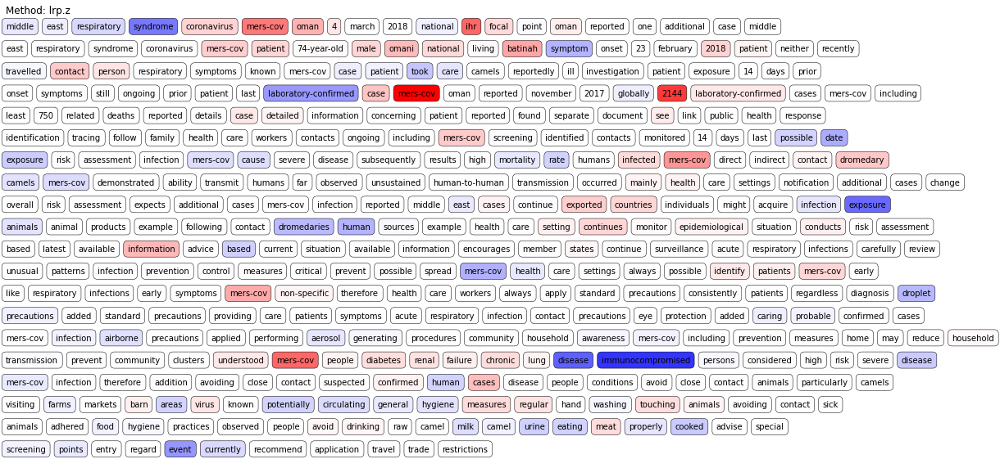

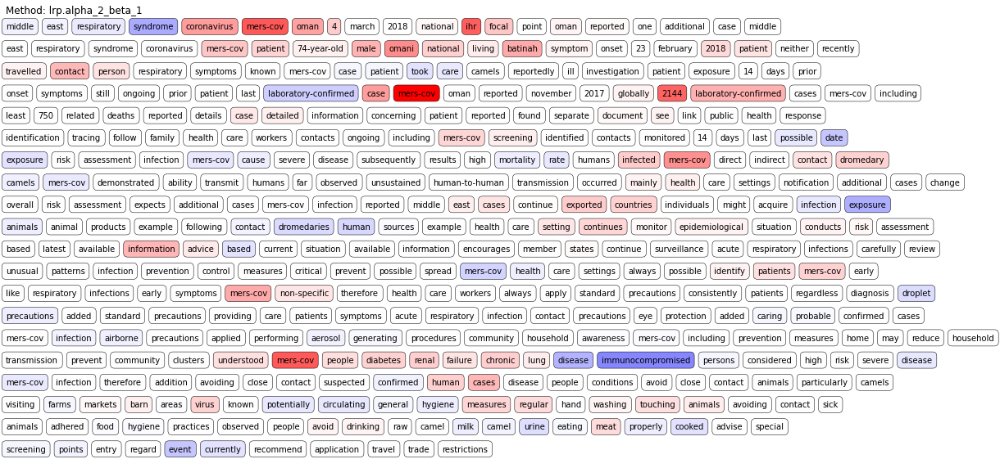

Review(id=605): rift valley fever kenya 8 june 2018 ministry health moh kenya confirmed outbreak rift valley fever first patient admitted hospital wajir county north-eastern kenya 2 june fever body weakness bleeding gums mouth patient reported consumed meat sick animal patient died day 4 june two relatives index patient admitted blood samples collected sent kenya medical research institute one confirmed positive rift valley fever 6 june 16 june total 26 human cases reported wajir 24 cases marsabit 2 cases counties including seven confirmed cases six deaths case fatality ratio cfr = 23 six patients discharged one still hospitalized high number deaths abortions among livestock including camels goats reported garissa <UNK> kitui marsabit tana river wajir counties people living counties reportedly consuming meat dead sick animals public health response preparedness activities rift valley fever ongoing since february 2018 reaction heavy rains flooding kenya alert issued county directors feb

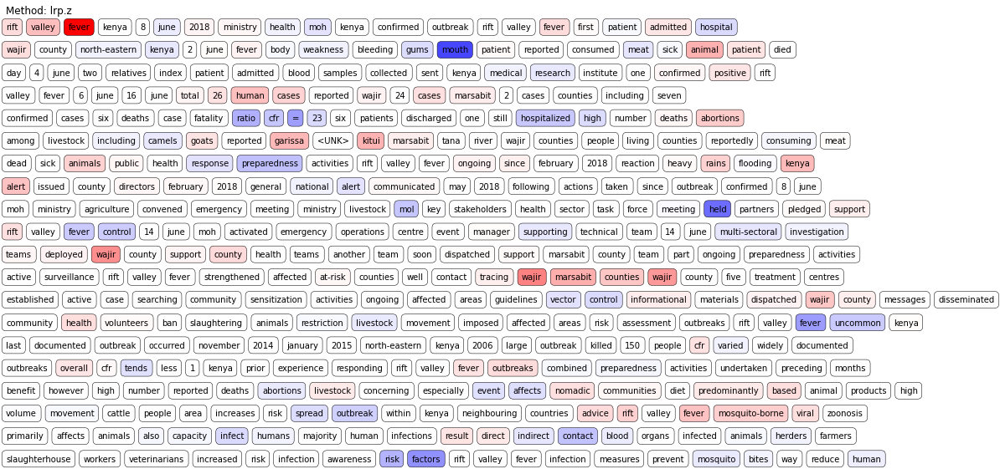

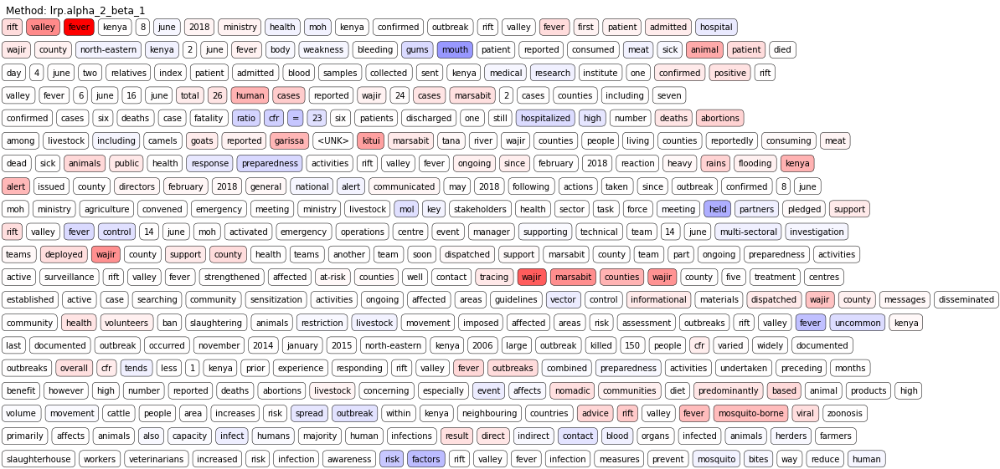

Review(id=608): lassa fever nigeria 1 january 15 april 2018 1849 suspected cases reported 21 states abia adamawa anambra bauchi benue delta ebonyi edo ekiti federal capital territory gombe imo kaduna kogi lagos nasarawa ondo osun plateau rivers taraba 413 patients confirmed lassa fever nine classified probable 1422 tested negative classified non-cases five remaining suspect cases laboratory results pending among 413 confirmed nine probable lassa fever cases 114 deaths reported case fatality rate confirmed cases 25.4 confirmed probable cases combined 27 15 april 27 health care workers seven states abia benue ebonyi edo kogi nasarawa ondo infected since 1 january 2018 eight died beginning outbreak january 2018 week ending 18 february number weekly reported lassa fever cases increased 10 70 cases late-february early march downward trend weekly reported number lassa fever cases less 20 cases reported week march five new cases reported week ending 15 april 2018 figure 1 figure 1 number conf

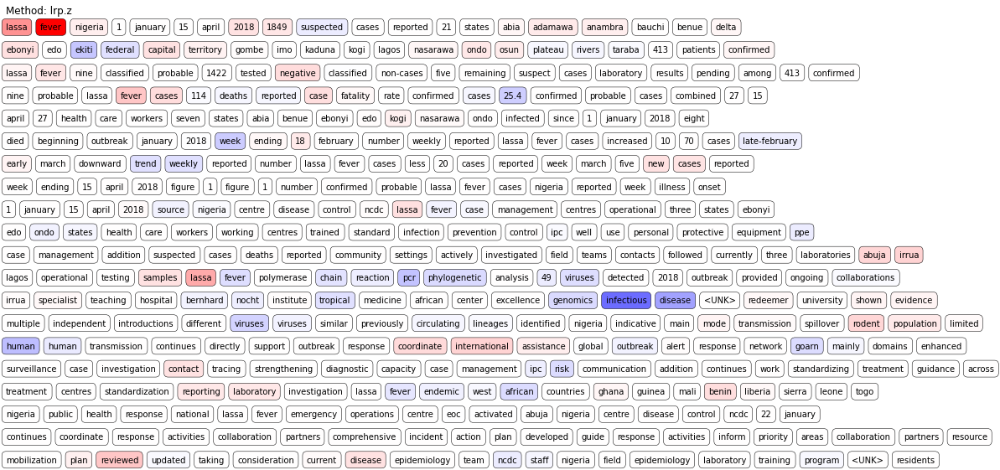

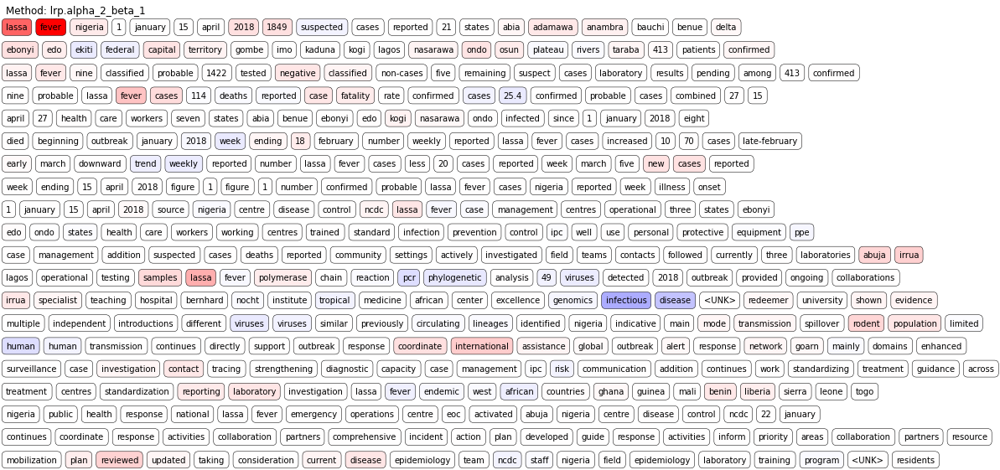

Review(id=624): yellow fever france french guiana 14 august 2018 world health organization received information regional office europe confirmed yellow fever case french guiana 10 august 2018 french national reference centre arboviruses institut pasteur de la guyane reported autochthonous locally acquired laboratory confirmed case yellow fever unvaccinated 47-year-old swiss man french guiana since april 2018 case patient lived forest area commune roura french guiana 4 august 2018 developed flu-like symptoms 8 august 2018 hospitalized cayenne french guiana fulminant hepatitis 9 august 2018 transferred paris france received liver transplant epidemiological entomological investigations conducted additional cases identified area patient accommodation contract tracing revealed contacts case-patient report unusual non-human primate mortality reverse transcription polymerase chain reaction rt-pcr test conducted french national reference centre positive yellow fever public health response fren

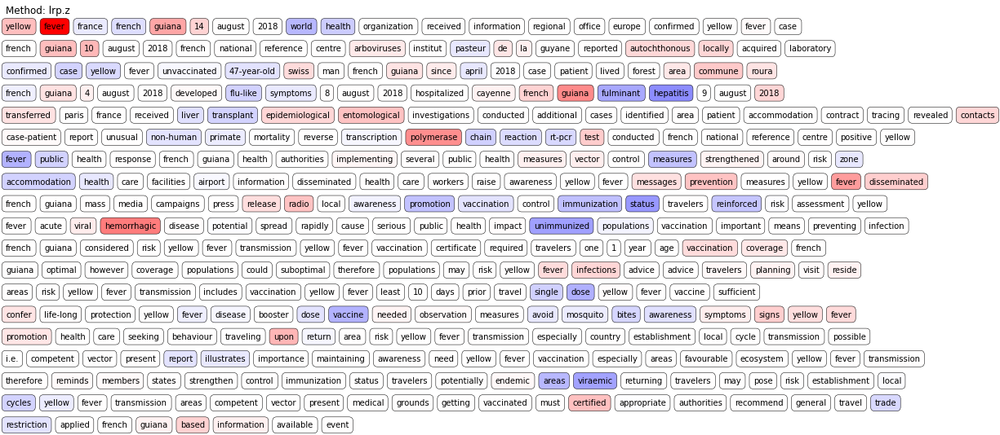

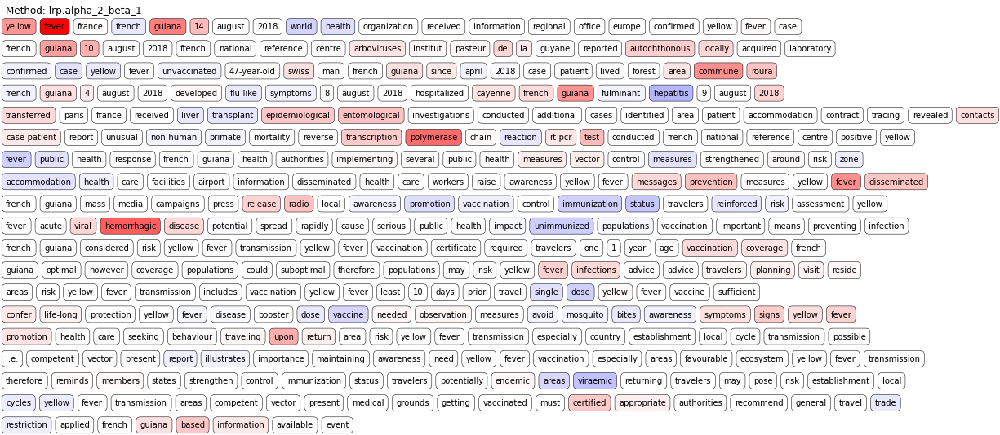

Review(id=640): circulating vaccine-derived poliovirus type 2 niger july september 2018 six cases circulating vaccine-derived poliovirus type 2 cvdpv2 reported niger genetically linked cvdpv2 case jigawa katsina states nigeria virus isolated children acute flaccid paralysis afp zinder region located south niger border nigeria dates onset paralysis ranging 18 july 16 september 2018 outbreak also affected jigawa katsina yobe gombe borno states nigeria 17 cases reported since april 2018 nigeria also reported separate cvdpv2 outbreak sokoto state dates back january 2018 nigeria one three countries world classified endemic wild poliovirus along afghanistan pakistan part polio outbreak response lake chad basin countries cameroon central african republic chad niger nigeria last monovalent oral polio vaccine type 2 mopv2 round implemented niger january 2017 public health response outbreak response plan finalized include outbreak zone risk exact scale extent response determined two mopv2 respon

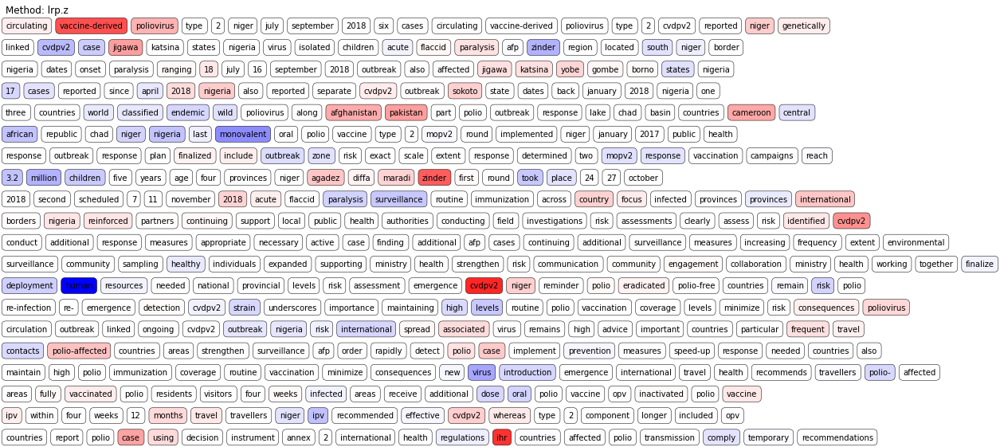

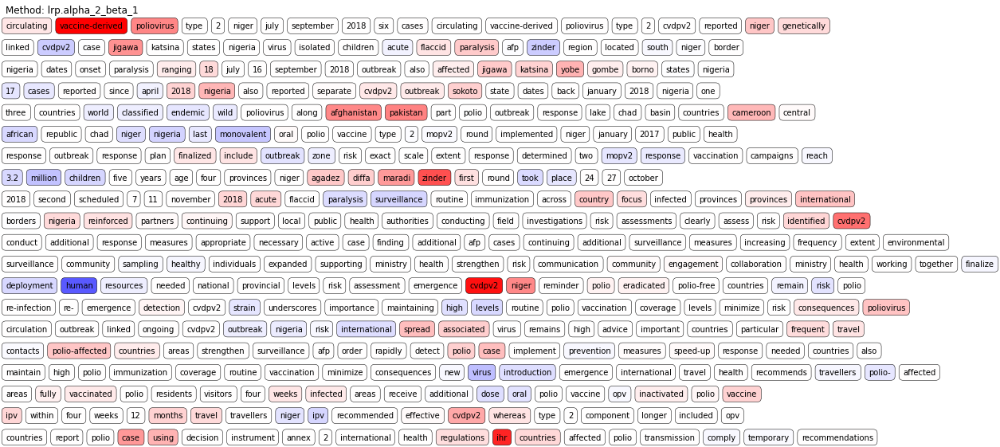

Review(id=642): middle east respiratory syndrome coronavirus mers-cov united kingdom great britain northern ireland 22 august 2018 international health regulations ihr 2005 national focal point united kingdom great britain northern ireland notified laboratory-confirmed middle east respiratory syndrome coronavirus mers-cov infection patient resident kingdom saudi arabia visiting united kingdom great britain northern ireland patient male aged 80-89 years underlying chronic medical conditions history recent travel contact sick patients kingdom saudi arabia history direct contact camels onset symptoms 16 august symptomatic patient travelled aircraft kingdom saudi arabia manchester united kingdom great britain northern ireland leeds car received treatment isolation leeds transferred specialist infectious disease facility liverpool patient condition improved continues isolation laboratory testing performed public health england phe birmingham laboratory results positive mers-cov results conf

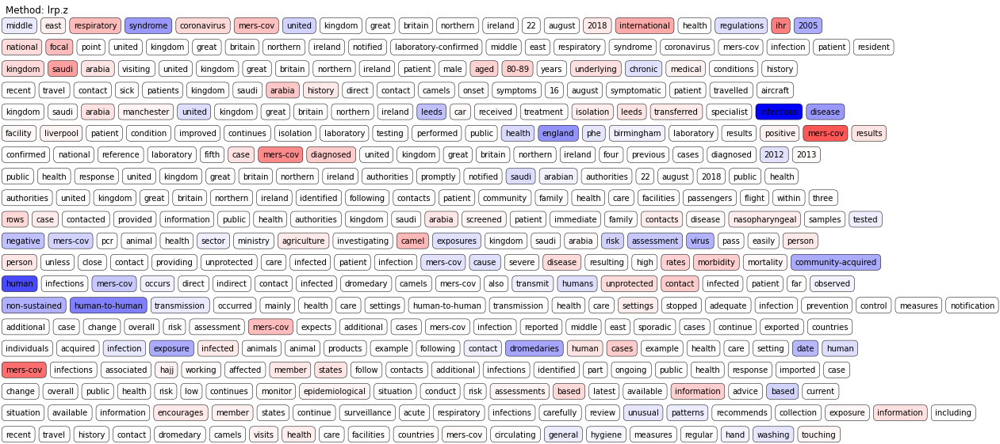

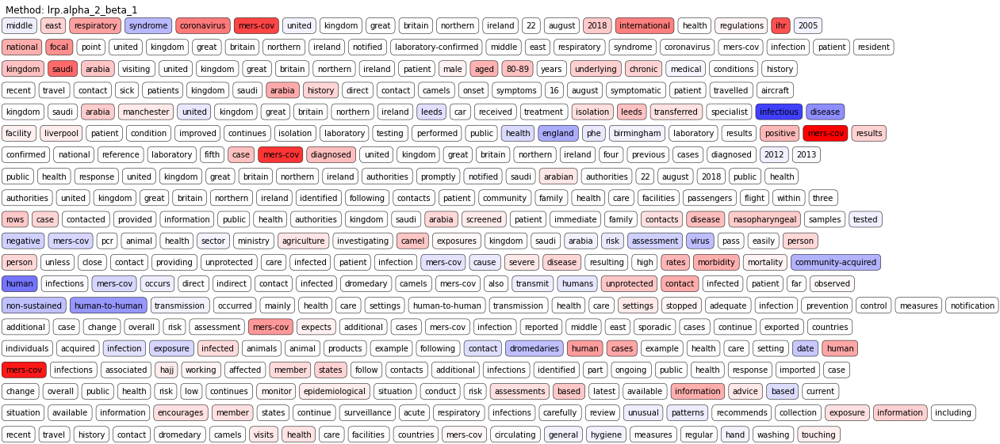

Review(id=643): nipah virus india event summary 19 may 2018 three deaths due nipah virus infection reported kozhikode district kerala state india three deaths occurred family cluster fourth death subsequently reported health care worker involved treatment family local hospital laboratory testing throat swabs urine blood samples collected four suspected patients conducted national institute virology pune three four reported deaths confirmed positive nipah virus niv real-time polymerase chain reaction rt-pcr igm elisa niv field investigation team found bats living abandoned water well premises new house family plans move renovation one bat caught sent national institute virology pune laboratory testing 28 may 2018 since beginning outbreak result investigations contact tracing 15 people tested positive niv kozhikode malappuram districts kerala state 15 laboratory- confirmed cases two hospitalized thirteen died including health care worker involved treatment deceased 28 may 13 deaths repor

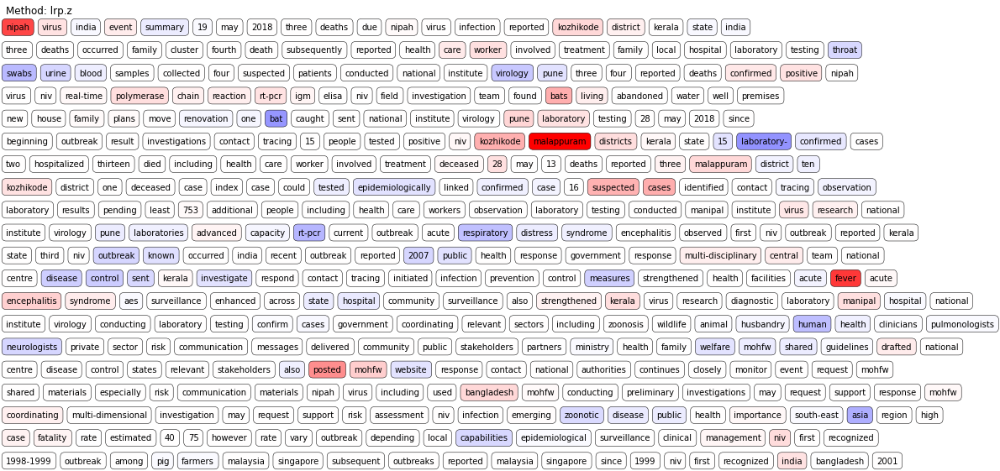

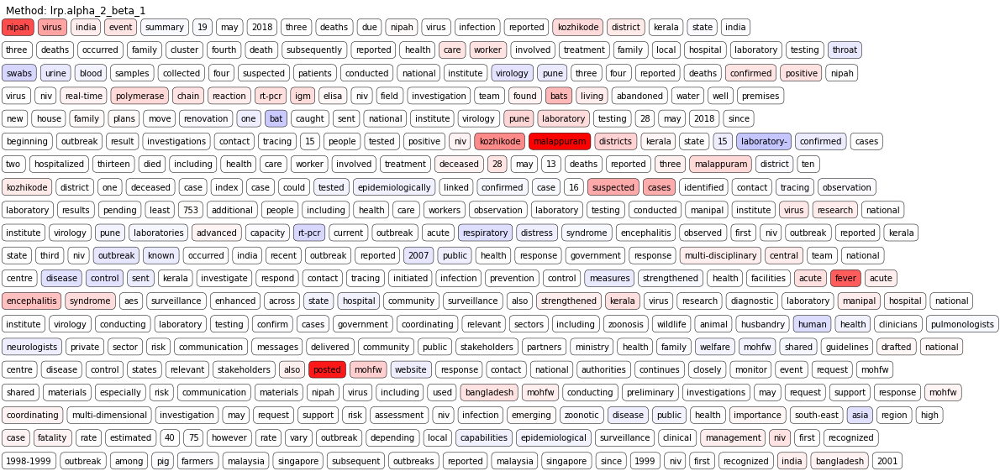

Review(id=644): ebola virus disease democratic republic congo 28 july 2018 north kivu provincial health division notified ministry health democratic republic congo cluster suspected acute haemorrhagic fever cases 1 august 2018 institut national de recherche biomédicale inrb kinshasa reported four six samples collected hospitalised patients tested positive genexpert automated pcr presumptive positive tests prompted immediate escalation response activities ministry health partners declaration outbreak minister health prompt alert ministry health international health regulations followed detection rapid investigation cluster suspected viral haemorrhagic fever family north kivu province mid late july 2018 local health officials since identified sporadic antecedent deaths community since may 2018 tentatively classified probable cases subject ongoing investigations determine related current outbreak ministry health partners working establish full extent outbreak 3 august 2018 total 43 ebola 

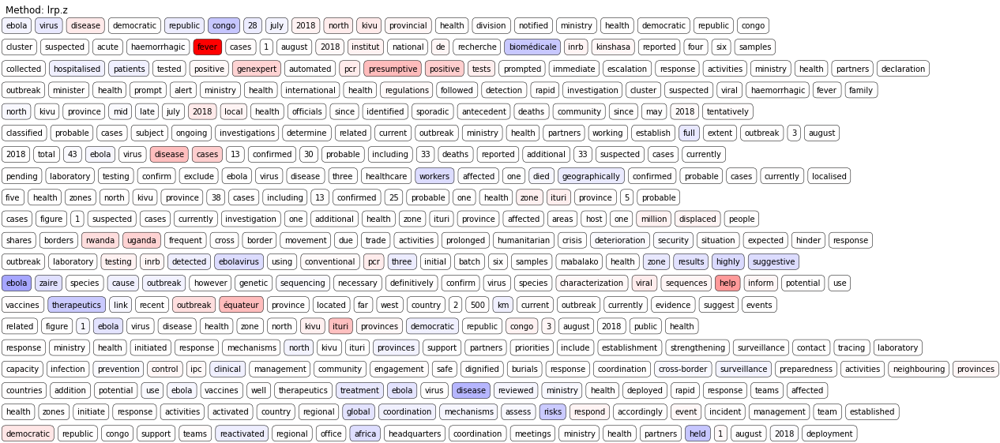

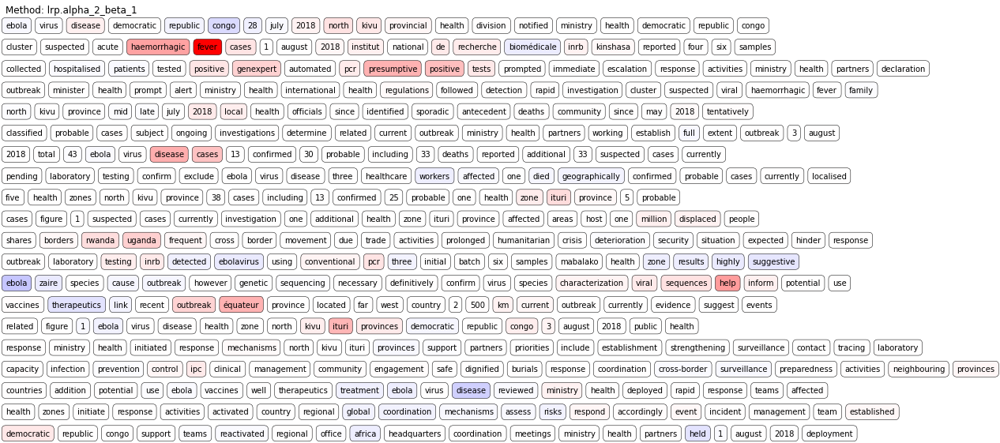

In [162]:
LABEL_IDX_TO_NAME = {0: "irrelevant", 1: "relevant"}

# Traverse over the analysis results and visualize them.
for i, idx in enumerate(test_sample_indices):

    words = [decoder[t] for t in list(DATASETS["testing"]["encoded_articles"][idx])]

    print("Review(id=%d): %s" % (idx, " ".join(words)))
    y_true = DATASETS["testing"]["y"][idx]
    y_pred = test_sample_preds[i]

    print(
        "Pred class : %s %s"
        % (
            LABEL_IDX_TO_NAME[y_pred],
            "✓" if y_pred == y_true else "✗ (%s)" % LABEL_IDX_TO_NAME[y_true],
        )
    )

    for j, method in enumerate(methods):
        if y_pred == y_true:
            name = f"{i}_gradient_plot_{method}.pdf"
            plot_text_heatmap(
                words,
                name,
                analysis[i, j].reshape(-1),
                title="Method: %s" % method,
                verbose=0,
            )
            plt.show()
            name = None
        else:
            name = None
